# Digital Twin Execution Report

## Preparation

### Dependecies

In [1]:
%load_ext autotime

time: 448 µs (started: 2021-06-09 13:57:09 -03:00)


In [2]:
import pandas as pd
import plotly.express as px
import json
import os
import plotly.offline as pyo
pyo.init_notebook_mode()

time: 836 ms (started: 2021-06-09 13:57:09 -03:00)


### Load Data

In [3]:
base_path = "../../data/runs/2021-06-09 16:49:23.697639-"

time: 1.91 ms (started: 2021-06-09 13:57:10 -03:00)


In [4]:
meta_path = base_path + "meta.json"
historical_path = base_path + "historical.csv.gz"
backtesting_path = base_path + "backtesting.csv.gz"
extrapolation_path = base_path + "extrapolation.csv.gz"

time: 680 µs (started: 2021-06-09 13:57:11 -03:00)


In [5]:
with open(meta_path, 'r') as fid:
    metadata = json.load(fid)
for i, row in metadata.items():
    print(f"{i}: {row}")
print("---")

createdAt: 2021-06-09 16:49:23.697639
initial_backtesting_timestamp: 2021-05-26 10:58:52
final_backtesting_timestamp: 2021-06-07 14:48:31
---
time: 3.94 ms (started: 2021-06-09 13:57:11 -03:00)


In [6]:
historical_df = pd.read_csv(historical_path).assign(origin='historical').iloc[1:].assign(subset=-1)
backtesting_df = pd.read_csv(backtesting_path).assign(origin='backtesting').iloc[1:]
extrapolation_df = pd.read_csv(extrapolation_path).assign(origin='extrapolation')

historical_df.loc[:, 'seconds_passed'] = backtesting_df.seconds_passed

past_df = (pd.concat([historical_df, backtesting_df])
             .reset_index(drop=True)
             .assign(seconds_passed=lambda df: df.seconds_passed - df.seconds_passed.min())          
          )

extrapolation_df.loc[:, 'seconds_passed'] += past_df.seconds_passed.max()
df = pd.concat([past_df, extrapolation_df])

df = (df
      .assign(hours_passed=lambda df: df.seconds_passed / (60 * 60))
      .assign(days_passed=lambda df: df.seconds_passed / (24 * 60 * 60))
     )

initial_time = pd.Timestamp(metadata['initial_backtesting_timestamp'])
deltas = df.hours_passed.map(lambda x: pd.Timedelta(x, unit='h'))
times = initial_time + deltas
df = df.assign(timestamp=times).reset_index()
last_time = df.query('origin == "extrapolation"').timestamp.min()

# Wrangling for extrapolation scenarios
def extrapolation_origin(_df):
    df = (_df.query("origin == 'extrapolation'")
             .assign(use_ewm_model=lambda df: df.use_ewm_model.fillna(0).astype(int))
             .assign(convergence_swap_intensity=lambda df: df.convergence_swap_intensity.fillna(0))
         )
    s = df.apply(lambda row: f"extrapolation (ewm={row.use_ewm_model}, csi={row.convergence_swap_intensity :.0%})", axis=1)
    return s

s = extrapolation_origin(df)
df.loc[s.index, 'origin'] = s

time: 240 ms (started: 2021-06-09 13:57:12 -03:00)


## Visualizations

### Prices

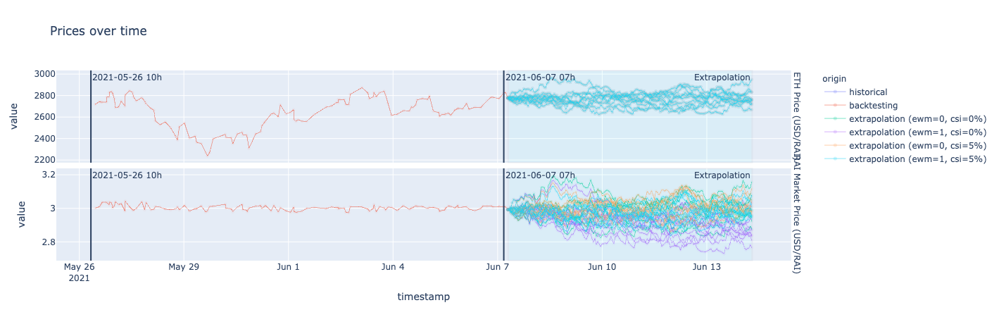

time: 802 ms (started: 2021-06-09 13:58:22 -03:00)


In [13]:
value_cols = ('eth_price', 'market_price')
id_cols = {'timestamp', 'origin', 'subset'}
fig_df = (df.melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'market_price': 'RAI Market Price (USD/RAI)'})
            .replace({'eth_price': 'ETH Price (USD/RAI)'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              labels={'market_price': 'RAI Market Price in USD'},
              title='Prices over time')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

### Controller State

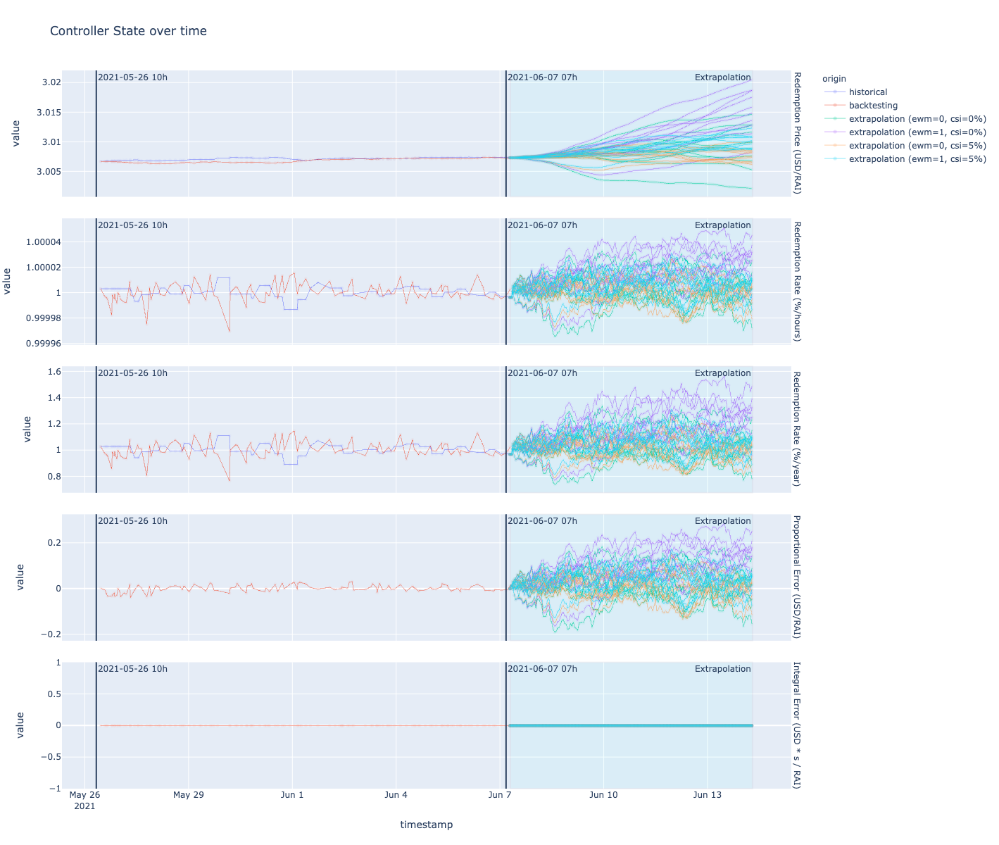

time: 2.55 s (started: 2021-06-09 13:58:43 -03:00)


In [14]:
value_cols = ('redemption_price', 
              'redemption_rate', 
              'redemption_rate_annual',
              'proportional_error',
              'integral_error')
id_cols = {'timestamp', 'origin', 'subset'}

fig_df = (df.assign(redemption_rate_annual=lambda df: df.redemption_rate ** (24 * 365))
            .melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'redemption_price': 'Redemption Price (USD/RAI)'})
            .replace({'redemption_rate': 'Redemption Rate (%/hours)'})
            .replace({'redemption_rate_annual': 'Redemption Rate (%/year)'})
            .replace({'proportional_error': 'Proportional Error (USD/RAI)'})
            .replace({'integral_error': 'Integral Error (USD * s / RAI)'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              height=1200,
              title='Controller State over time')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

### Token State

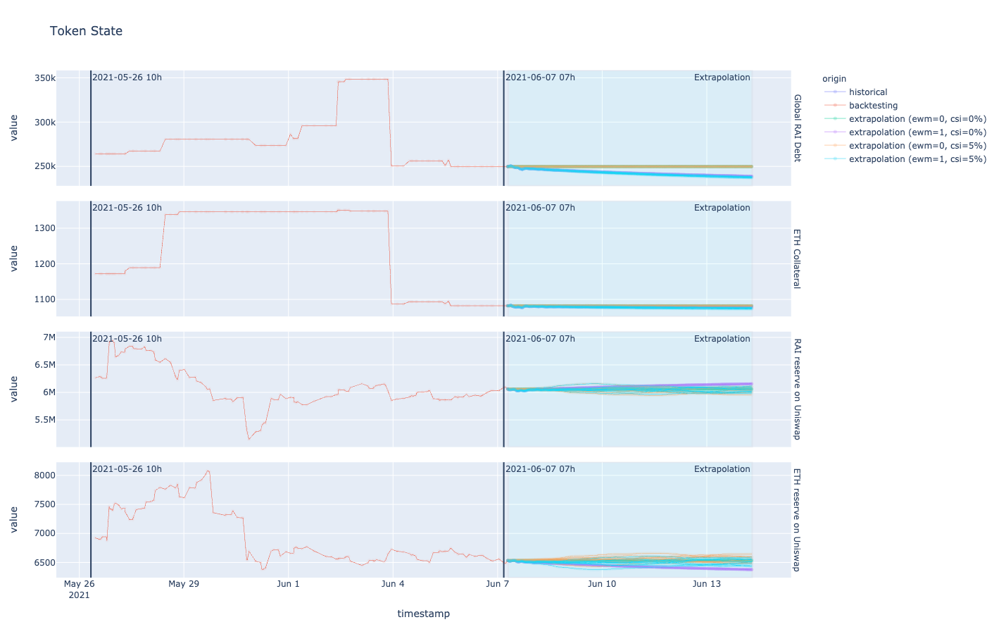

time: 1.86 s (started: 2021-06-09 13:59:03 -03:00)


In [15]:
value_cols = ('rai_debt', 'eth_locked', 'rai_reserve', 'eth_reserve')
id_cols = {'timestamp', 'origin', 'subset'}
fig_df = (df.melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'rai_debt': 'Global RAI Debt'})
            .replace({'eth_locked': 'ETH Collateral'})
            .replace({'rai_reserve': 'RAI reserve on Uniswap'})
            .replace({'eth_reserve': 'ETH reserve on Uniswap'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              labels={'market_price': 'RAI Market Price in USD'},
              height=900,
              title='Token State')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()